## Notebook for replicating the plots
In this notebook you will learn how to replicate the plots. If you want to know how to generate the data used in the plots, we refer to the gen_temperature_data and gen_precipitation_data notebooks. First we import some packages.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from QAR_persistence_precip import QAR_precipitation
from QAR import QAR_temperature
import seaborn as sns
import pandas as pd
from plots_europe import plot_binomial_probabilities, analyze_temperature_vs_nao, plot_nao_quintiles_vs_rain_prob, plot_combined, get_season, analyze_nao_precipitation, plot_combined_heatmaps, rolling_window_precipitation, plot_coefficient_evolution
from scipy import stats
import os

# Suppress SettingWithCopyWarning
pd.options.mode.chained_assignment = None  

#### Plot figure 1


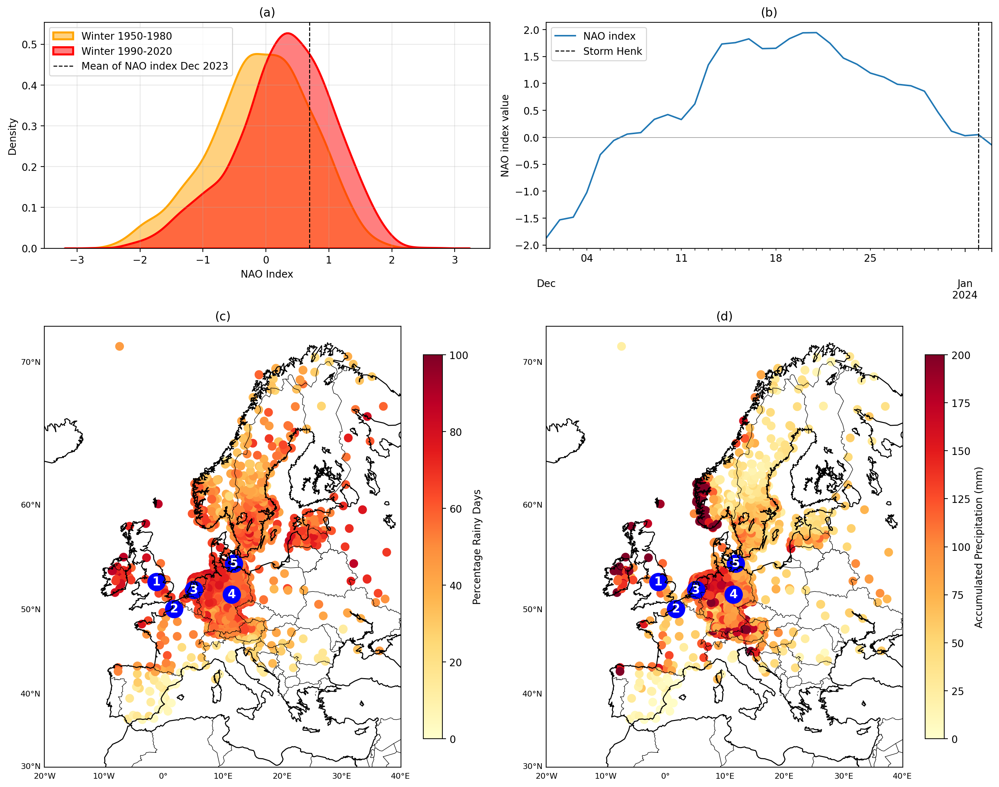

In [2]:
analyze_nao_precipitation()


#### Plot Figure 2

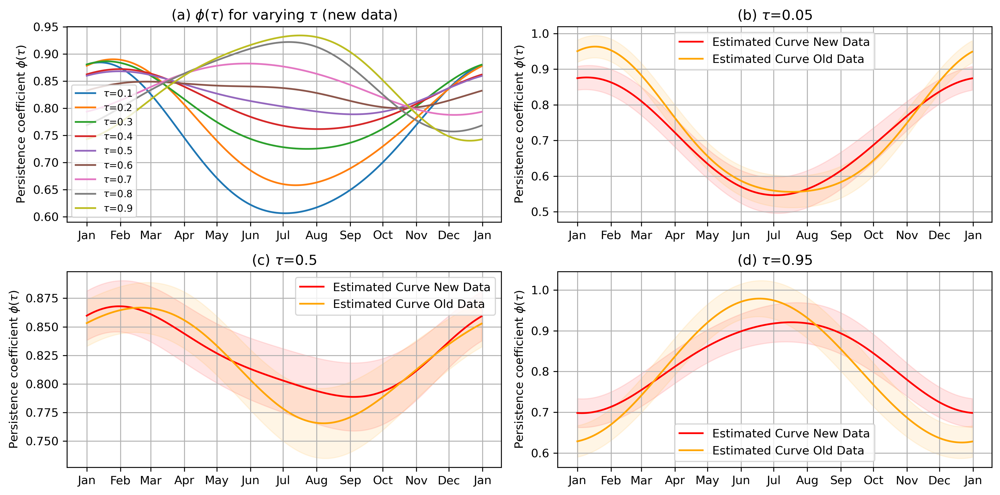

In [7]:
test = QAR_temperature(sCity='DE BILT',use_statsmodels=True, include_nao=False, split_nao=False, iLeafs=1)
test.plot_fourier_fit_full(vTau=[0.05, 0.5, .95], alpha=0.05)

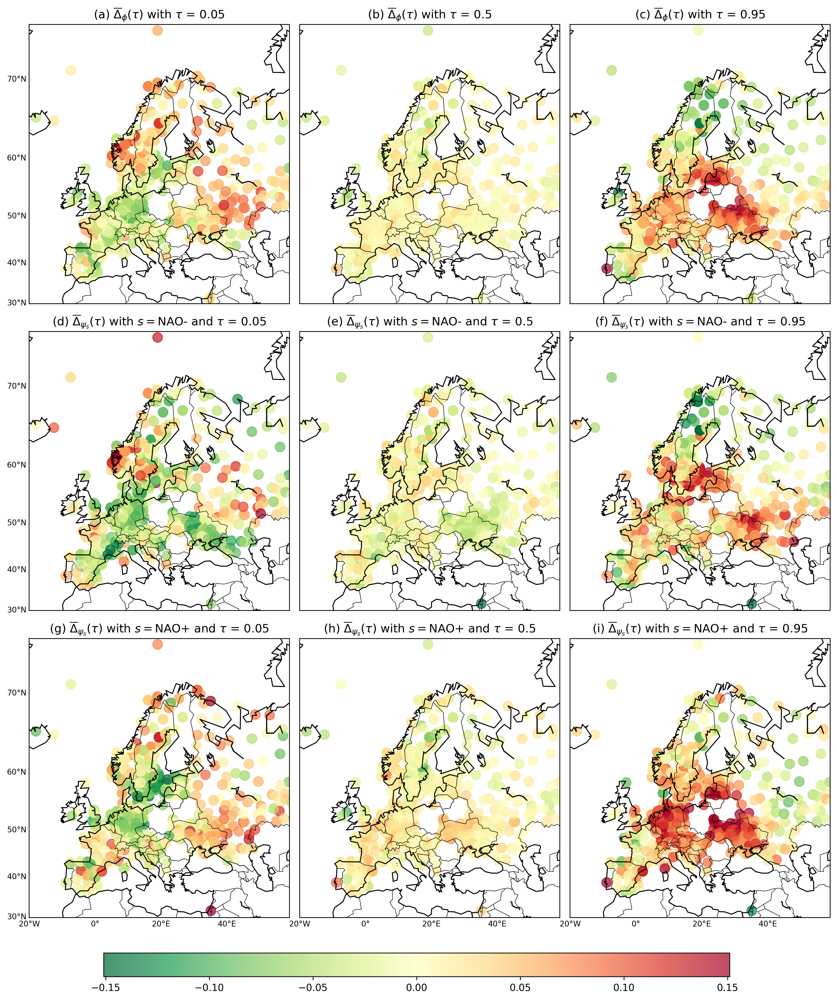

In [3]:
df_05 = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_05_1950final.csv')
df_50 = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_.5_1950final.csv')
df_95 = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_95_1950final.csv')

df_05_plusmin = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_05_1950includeNAO.csv')
df_50_plusmin = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_.5_1950includeNAO.csv')
df_95_plusmin = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_95_1950includeNAO.csv')

df_results_list = [df_05, df_50, df_95, df_05_plusmin, df_50_plusmin, df_95_plusmin]
plot_combined(df_results_list, 'winter')

#### Plot Figure 4


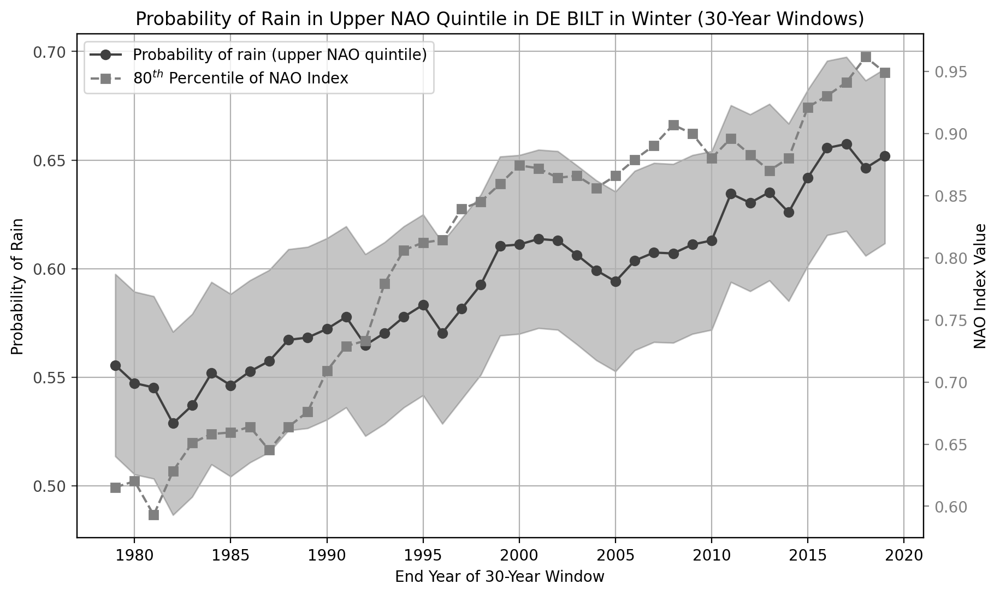

In [2]:
rolling_window_precipitation(sCity='DE BILT', greyscale=True)


#### Plot Figure 5

posx and posy should be finite values


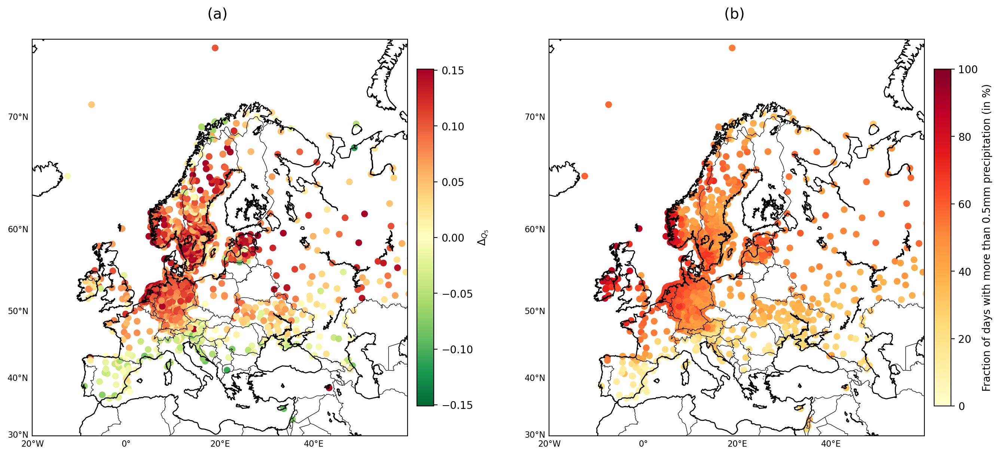

In [3]:
df1 = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_precipitation_1950Fig4b.csv')
df2 = pd.read_csv('/Users/admin/Documents/PhD/persistence/data_persistence/results_precipitation_1950WithUncProbabilities.csv')

plot_combined_heatmaps(
    df1=df1,  # Now becomes subplot (b)
    df2=df2,          # Now becomes subplot (a)
    sType1='percentage_rainy_days_upperquintile',
    title1='',
    sSeason='winter',
    sType2='_unc',
    title2=''
)

#### Plot Figure 6

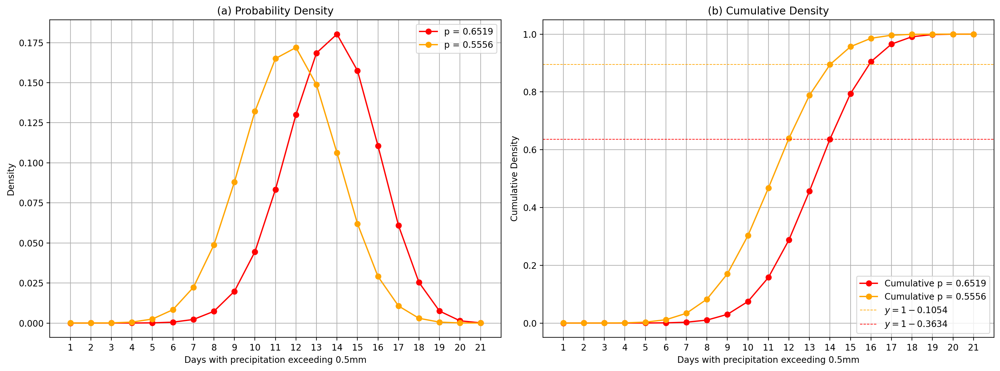

In [6]:
# Parameters
total_days = 21  # Total number of days (trials)
x_days = np.arange(1, total_days + 1)  # Number of consecutive hits (successes)
p1 = 0.6518518518518519  # Probability of precipitation>.5mm for the ''new'' data
p2 = .5555555555555556   # Probability of precipitation>.5mm for the ''old'' data
# Cumulative probabilities (CDF) for both p1 and p2
plot_binomial_probabilities(total_days=total_days, p1=p1, p2=p2, greyscale=False)


## APPENDIX
#### Plot Figure 7 

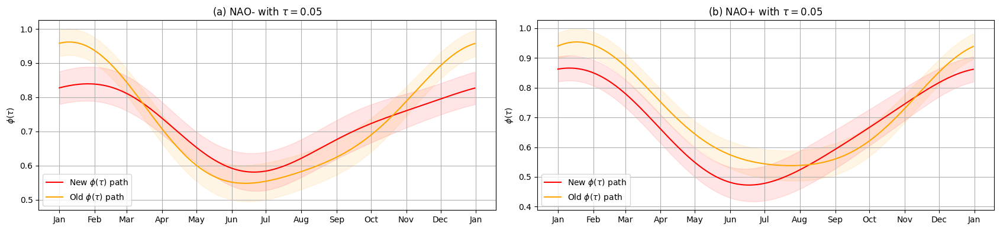

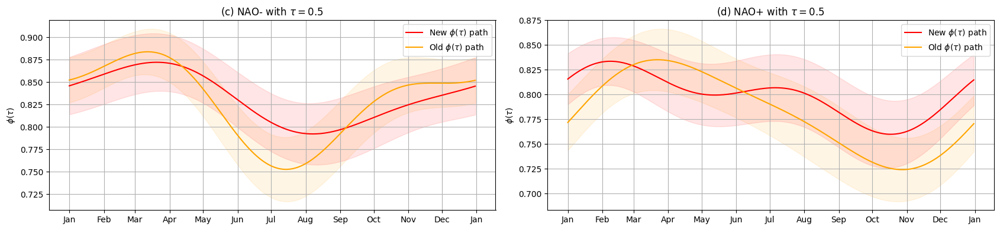

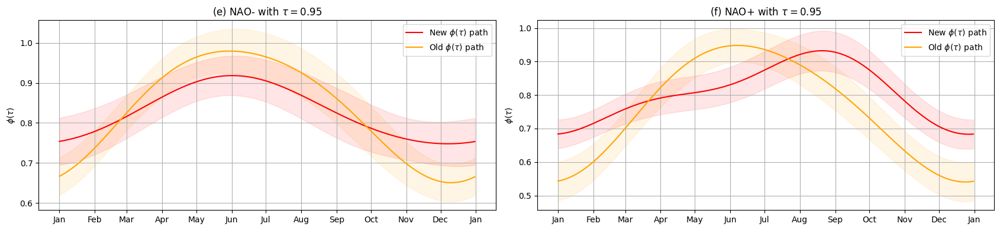

In [4]:
test = QAR_temperature(sCity='DE BILT', fTau=.05, use_statsmodels=True, include_nao=True, split_nao=True, iLeafs=2)
test.plot_paths_with_nao(2019, greyscale=False)
test = QAR_temperature(sCity='DE BILT', fTau=.5, use_statsmodels=True, include_nao=True, split_nao=True, iLeafs=2)
test.plot_paths_with_nao(2019, greyscale=False)
test = QAR_temperature(sCity='DE BILT', fTau=.95, use_statsmodels=True, include_nao=True, split_nao=True, iLeafs=2)
test.plot_paths_with_nao(2019, greyscale=False)


#### Figure 8

Currently calculating coefficients for 1990-2020

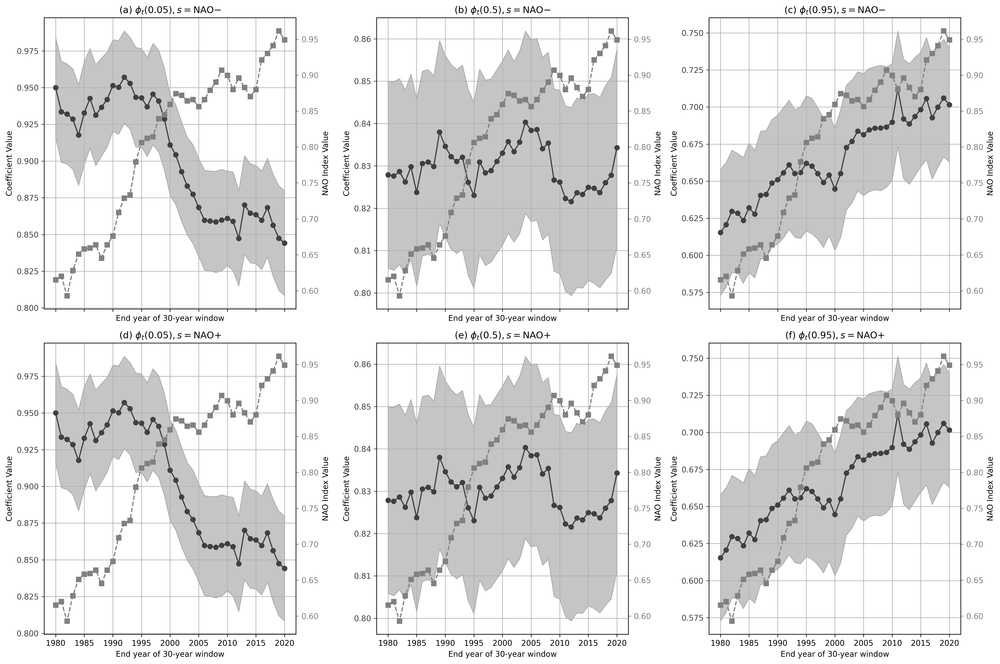

In [7]:
plot_coefficient_evolution(sCity='DE BILT', greyscale=True)


#### Figure 9

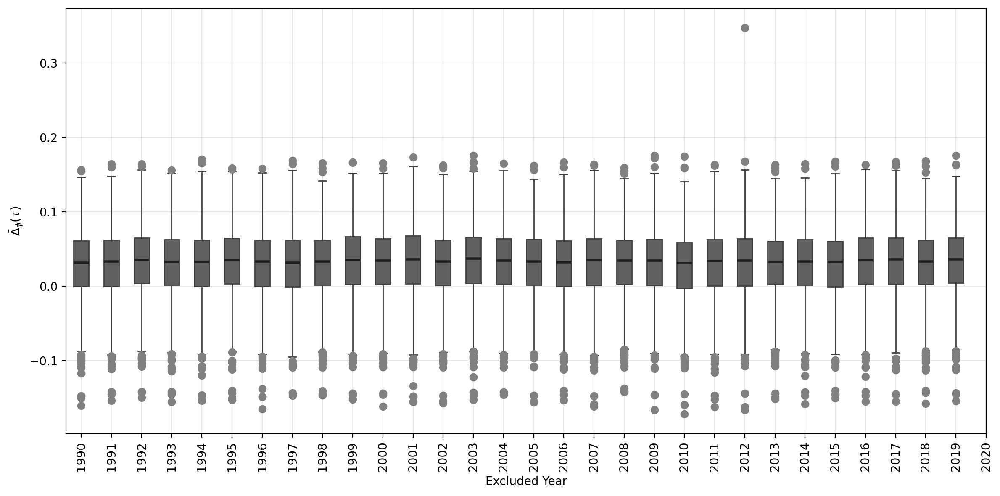

In [8]:
#######FIGURE 9  boxplot temperature
def plot_excluded_years_boxplot(greyscale=False):
    """
    Creates boxplots of mean_diff_pers_winter values across excluded years.

    Parameters:
    - greyscale (bool): If True, use greyscale colors (default: False)

    Returns:
    - None (Displays the plot)
    """
    
    # Directory where the CSV files are located
    directory = "../data_persistence/"

    # Initialize lists to store data
    data = []
    excluded_years = []

    # Loop through all the files in the directory
    for filename in sorted(os.listdir(directory)):
        # Only process files that start with 'results_' and end with '_0.95_1950.csv'
        if filename.startswith("results_") and filename.endswith("_0.95_1950.csv"):
            # Extract the excluded year from the filename
            excluded_year = filename.split('_')[1]
            excluded_years.append(excluded_year)

            # Read the CSV file
            filepath = os.path.join(directory, filename)
            df = pd.read_csv(filepath)

            # Extract the 'mean_diff_pers_winter' column
            if 'mean_diff_pers_winter' in df.columns:
                mean_diff_values = df['mean_diff_pers_winter'].values

                # Remove the maximum value from the column
                mean_diff_values = mean_diff_values[mean_diff_values != mean_diff_values.max()]

                # Append the remaining values to the data list
                data.append(mean_diff_values)

    # Define colors based on greyscale parameter
    if greyscale:
        box_color = '#606060'      # Medium grey for box fill
        whisker_color = '#404040'  # Dark grey for whiskers
        median_color = '#202020'   # Very dark grey for median line
        flier_color = '#808080'    # Light grey for outliers
    else:
        box_color = 'lightblue'
        whisker_color = 'black'
        median_color = 'red'
        flier_color = 'black'

    # Create the boxplot
    fig, ax = plt.subplots(figsize=(12, 6), dpi=200, facecolor="white")
    bp = ax.boxplot(data, patch_artist=True)

    # Apply colors to boxplot elements
    for box in bp['boxes']:
        box.set_facecolor(box_color)
        box.set_edgecolor(whisker_color)
    for whisker in bp['whiskers']:
        whisker.set_color(whisker_color)
    for cap in bp['caps']:
        cap.set_color(whisker_color)
    for median in bp['medians']:
        median.set_color(median_color)
        median.set_linewidth(2)
    for flier in bp['fliers']:
        flier.set_markeredgecolor(flier_color)
        flier.set_markerfacecolor(flier_color if greyscale else 'none')

    # Add labels and title
    ax.set_xticks(ticks=range(1, len(excluded_years) + 1))
    ax.set_xticklabels(labels=excluded_years, rotation=90)
    ax.set_xlabel("Excluded Year")
    ax.set_ylabel("$\\bar{\\Delta}_{\\phi}(\\tau)$")
    ax.grid(True, alpha=0.3)

    # Show the plot
    plt.tight_layout()
    plt.show()

plot_excluded_years_boxplot(greyscale=True)


#### Figure 10

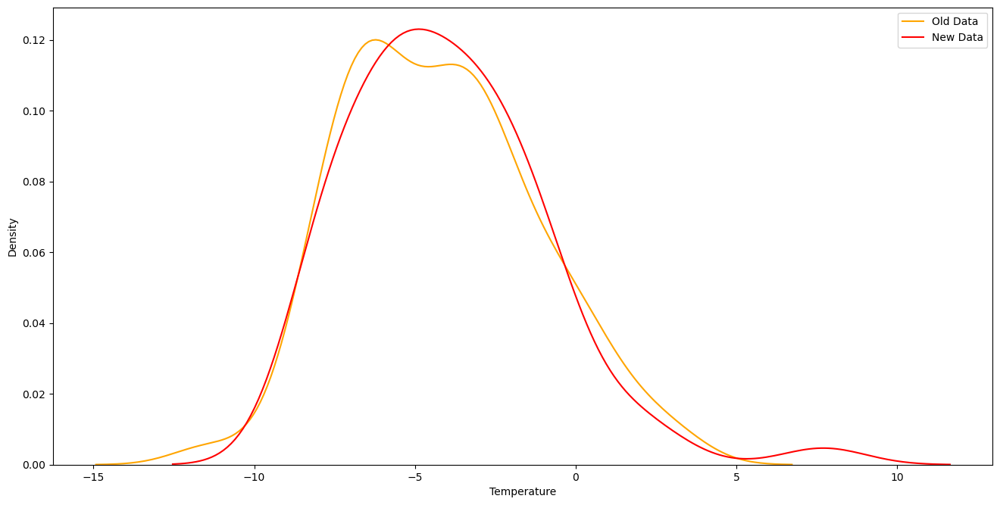

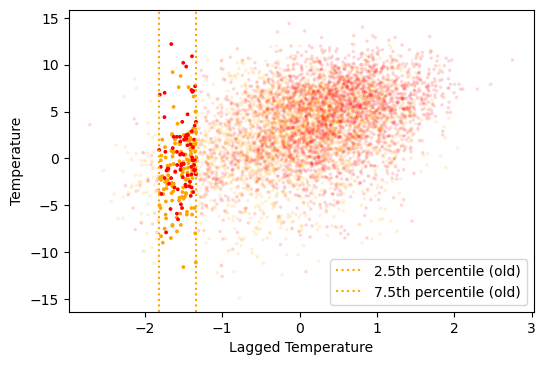

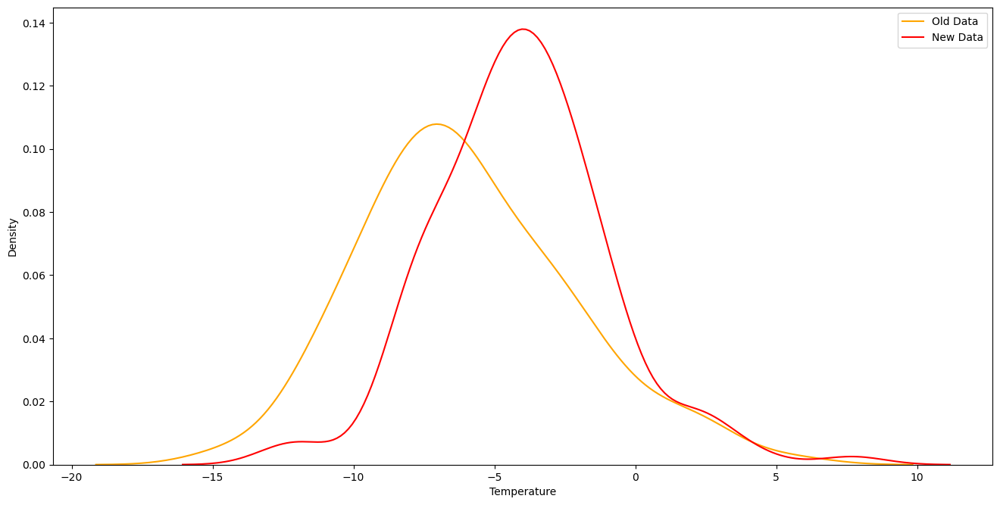

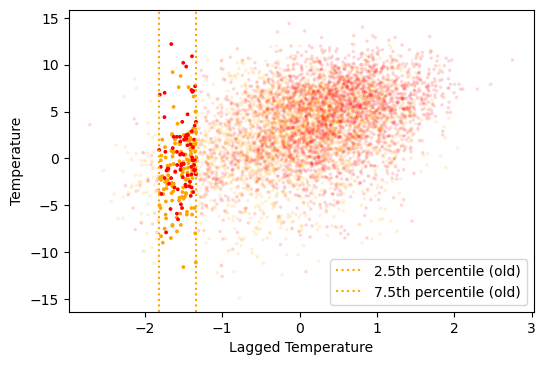

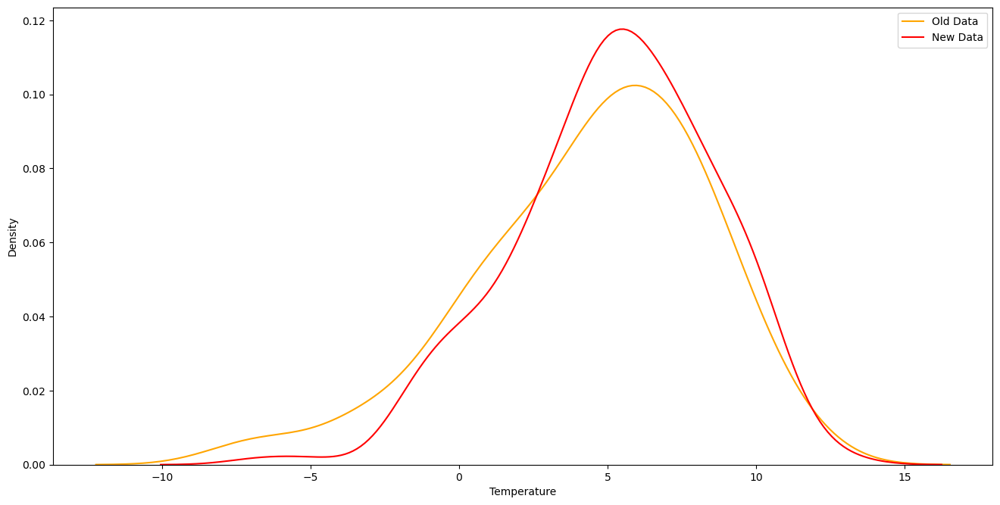

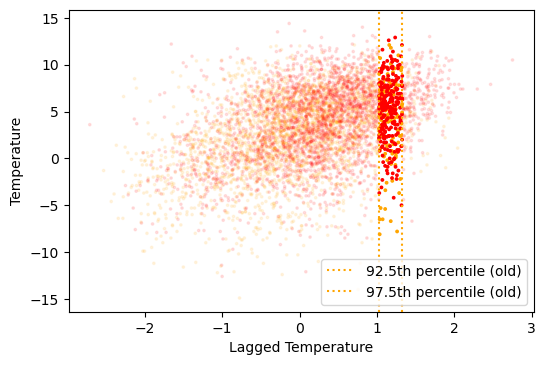

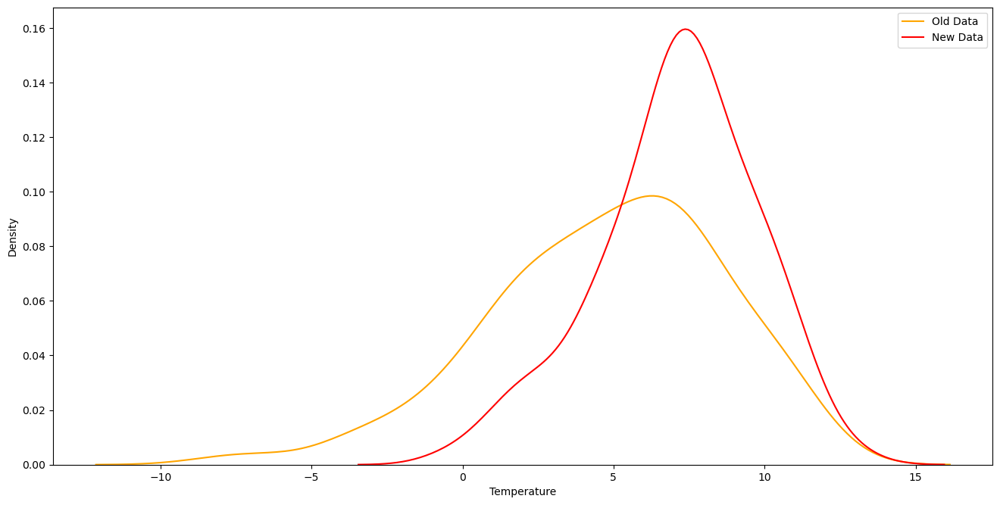

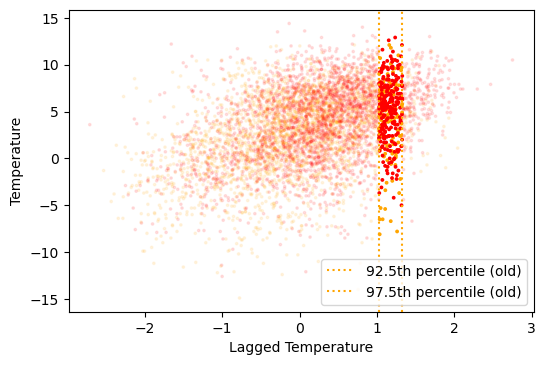

In [2]:
analyze_temperature_vs_nao(sCity='DE BILT', quant=0.05, temp=True, fix_old=True)
analyze_temperature_vs_nao(sCity='DE BILT', quant=0.05, temp=True, fix_old=False)

analyze_temperature_vs_nao(sCity='DE BILT', quant=0.95, temp=False, fix_old=True)
analyze_temperature_vs_nao(sCity='DE BILT', quant=0.95, temp=False, fix_old=False)

#### Figure 11

In [14]:
def plot_nao_quintiles_vs_rain_prob(sCity='DE BILT', fTau=0.95, mm_threshold=5, confidence=0.95, pattern='NAO', greyscale=False):
    """
    Computes and plots the probability of rain conditioned on NAO index quintiles
    for both past and recent periods.

    Parameters:
    - sCity (str): City name (default: 'DE BILT')
    - fTau (float): Quantile regression parameter (default: 0.95)
    - mm_threshold (float): Threshold for considering a day as rainy (default: 5mm)
    - confidence (float): Confidence level for error bars (default: 0.95)
    - pattern (str): Pattern name (default: 'NAO')
    - greyscale (bool): If True, use greyscale colors (default: False)

    Returns:
    - None (Displays the plot)
    """

    # Initialize QAR object
    test = QAR_precipitation(sCity=sCity, fTau=fTau, use_statsmodels=True, include_nao=True, pattern=pattern)
    test.prepare_data()

    # Winter months
    months = [12, 1, 2]
    
    # Generate binary time series for precipitation
    y_prec_old = (test.old.Temp >= mm_threshold) * 1
    data_old = pd.DataFrame(y_prec_old, columns=['Temp'])
    data_old['nao_index_cdas'] = test.old.nao_index_cdas

    y_prec_new = (test.new.Temp >= mm_threshold) * 1
    data_new = pd.DataFrame(y_prec_new, columns=['Temp'])
    data_new['nao_index_cdas'] = test.new.nao_index_cdas

    # Filter winter months
    data_winter_new = data_new.loc[data_new.index.month.isin(months)]
    data_winter_old = data_old.loc[data_old.index.month.isin(months)]

    # Confidence interval calculation
    z_score = stats.norm.ppf((1 + confidence) / 2)

    # Define quintiles
    quantiles = np.linspace(0, 1, 6)  
    p_rain_new, p_rain_old, ci_low_new, ci_high_new, ci_low_old, ci_high_old = [], [], [], [], [], []

    # Compute probabilities and confidence intervals for each NAO quintile
    for i in range(len(quantiles) - 1):
        lower_quantile = quantiles[i]
        upper_quantile = quantiles[i + 1]

        # New dataset
        mask_new = (data_winter_new.nao_index_cdas.shift(1) < np.quantile(data_winter_new.nao_index_cdas, upper_quantile)) & \
                   (data_winter_new.nao_index_cdas.shift(1) > np.quantile(data_winter_new.nao_index_cdas, lower_quantile))
        subset_new = data_winter_new.loc[mask_new]
        mean_temp_new = subset_new.mean().Temp
        std_temp_new = subset_new.Temp.std()
        n_new = subset_new.shape[0]
        se_new = std_temp_new / np.sqrt(n_new) if n_new > 0 else 0
        ci_low_new.append(mean_temp_new - z_score * se_new)
        ci_high_new.append(mean_temp_new + z_score * se_new)
        p_rain_new.append(mean_temp_new)

        # Old dataset
        mask_old = (data_winter_old.nao_index_cdas.shift(1) < np.quantile(data_winter_old.nao_index_cdas, upper_quantile)) & \
                   (data_winter_old.nao_index_cdas.shift(1) > np.quantile(data_winter_old.nao_index_cdas, lower_quantile))
        subset_old = data_winter_old.loc[mask_old]
        mean_temp_old = subset_old.mean().Temp
        std_temp_old = subset_old.Temp.std()
        n_old = subset_old.shape[0]
        se_old = std_temp_old / np.sqrt(n_old) if n_old > 0 else 0
        ci_low_old.append(mean_temp_old - z_score * se_old)
        ci_high_old.append(mean_temp_old + z_score * se_old)
        p_rain_old.append(mean_temp_old)

    # Define colors based on greyscale parameter
    if greyscale:
        color_old = '#808080'  # Medium grey for old data
        color_new = '#404040'  # Dark grey for new data
    else:
        color_old = 'orange'
        color_new = 'red'

    # Create a plot
    plt.figure(figsize=(10, 5), dpi=100, facecolor="white")

    # Define positions for the bars
    x = np.arange(len(p_rain_new))  # The x locations for the groups
    width = 0.2  # The width of the bars

    # Plot old data
    plt.errorbar(x - width/2, p_rain_old, yerr=[np.array(p_rain_old) - np.array(ci_low_old), np.array(ci_high_old) - np.array(p_rain_old)], 
                 fmt='o', color=color_old, label='Old', capsize=3, markersize=6)

    # Plot new data
    plt.errorbar(x + width/2, p_rain_new, yerr=[np.array(p_rain_new) - np.array(ci_low_new), np.array(ci_high_new) - np.array(p_rain_new)], 
                 fmt='s' if greyscale else 'o', color=color_new, label='New', capsize=3, markersize=6)

    # Labeling
    plt.xticks(x, [f'Q{i+1}' for i in range(len(p_rain_new))])
    plt.xlabel('NAO Index Quintiles')
    plt.ylabel('Probability of Rain')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Show plot
    plt.tight_layout()
    plt.show()

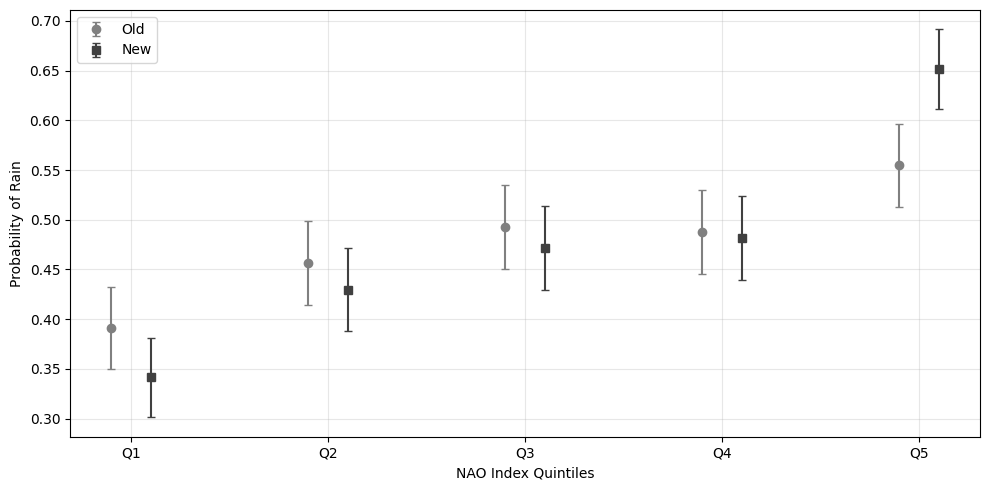

In [15]:
plot_nao_quintiles_vs_rain_prob(sCity='DE BILT', greyscale=True)


#### Figure 12

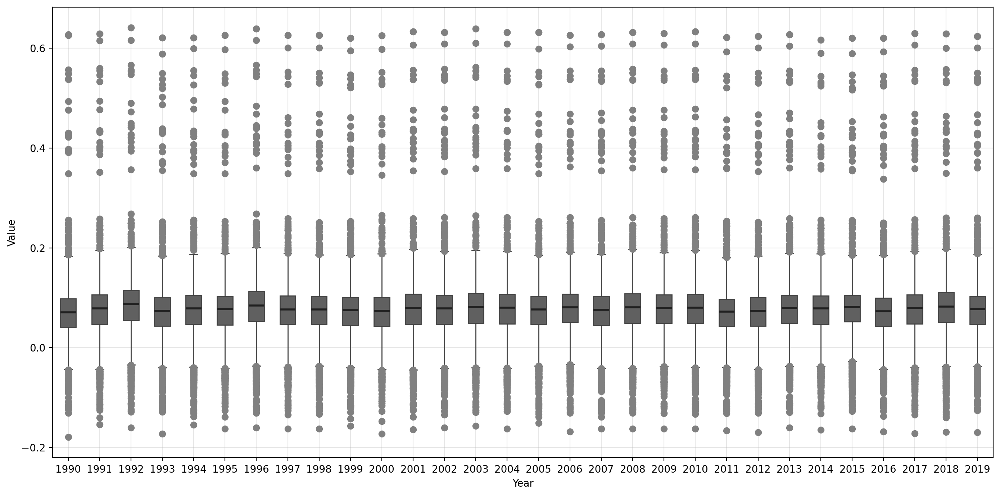

In [10]:
def plot_precipitation_boxplot(greyscale=False):
    """
    Creates boxplots of mean_diff_winter_unc values across years.

    Parameters:
    - greyscale (bool): If True, use greyscale colors (default: False)

    Returns:
    - None (Displays the plot)
    """
    
    # Path where the new precipitation CSV files are stored
    folder_path = '../data_persistence/'  # Replace with your actual folder path

    # List all the files that match the "results_precipitation_DJF_YYYY.csv" pattern
    files = sorted([file for file in os.listdir(folder_path) if file.startswith('results_precipitation_DJF_') and file.endswith('.csv')])

    # Initialize a dictionary to hold data for each year
    mean_diff_winter_data = {}

    # Loop through the files to extract the relevant data
    for file in files:
        # Extract the year from the filename
        year = int(file.split('_')[3].split('.')[0])

        # Process files only in the range of 1990 to 2019
        if 1990 <= year <= 2019:
            # Read the CSV file
            df = pd.read_csv(os.path.join(folder_path, file))

            # Extract the data for the 'mean_diff_winter' variable if it exists
            if 'mean_diff_winter' in df.columns:
                mean_diff_winter_data[year] = df['mean_diff_winter_unc'].dropna()

    # Define colors based on greyscale parameter
    if greyscale:
        box_color = '#606060'      # Medium grey for box fill
        whisker_color = '#404040'  # Dark grey for whiskers
        median_color = '#202020'   # Very dark grey for median line
        flier_color = '#808080'    # Light grey for outliers
    else:
        box_color = 'lightblue'
        whisker_color = 'black'
        median_color = 'red'
        flier_color = 'black'

    # Create a boxplot for 'mean_diff_winter' over the years
    fig, ax = plt.subplots(figsize=(14, 7), dpi=200, facecolor='white')

    # Convert the dictionary to a list for plotting
    years = sorted(mean_diff_winter_data.keys())
    mean_diff_winter = [mean_diff_winter_data[year] for year in years]

    # Boxplot for 'mean_diff_winter'
    bp = ax.boxplot(mean_diff_winter, labels=years, patch_artist=True)

    # Apply colors to boxplot elements
    for box in bp['boxes']:
        box.set_facecolor(box_color)
        box.set_edgecolor(whisker_color)
    for whisker in bp['whiskers']:
        whisker.set_color(whisker_color)
    for cap in bp['caps']:
        cap.set_color(whisker_color)
    for median in bp['medians']:
        median.set_color(median_color)
        median.set_linewidth(2)
    for flier in bp['fliers']:
        flier.set_markeredgecolor(flier_color)
        flier.set_markerfacecolor(flier_color if greyscale else 'none')

    ax.set_xlabel('Year')
    ax.set_ylabel('Value')
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


# Usage:
# Color version
plot_precipitation_boxplot(greyscale=True)

# Greyscale version
# plot_precipitation_boxplot(greyscale=True)
